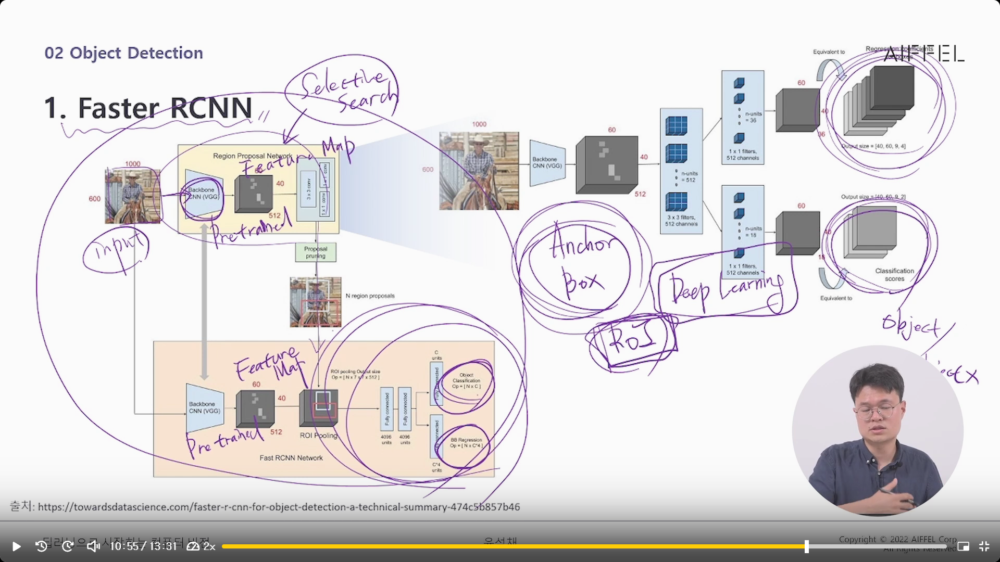

In [1]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

이미지 시각화 함수






In [2]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

이미지 resizing 함수

In [3]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

Bounding Box 함수






In [4]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수도 만듭니다.






In [5]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행해 보세요.






Image downloaded to C:\Users\User\AppData\Local\Temp\tmplcy0pcqs.jpg.


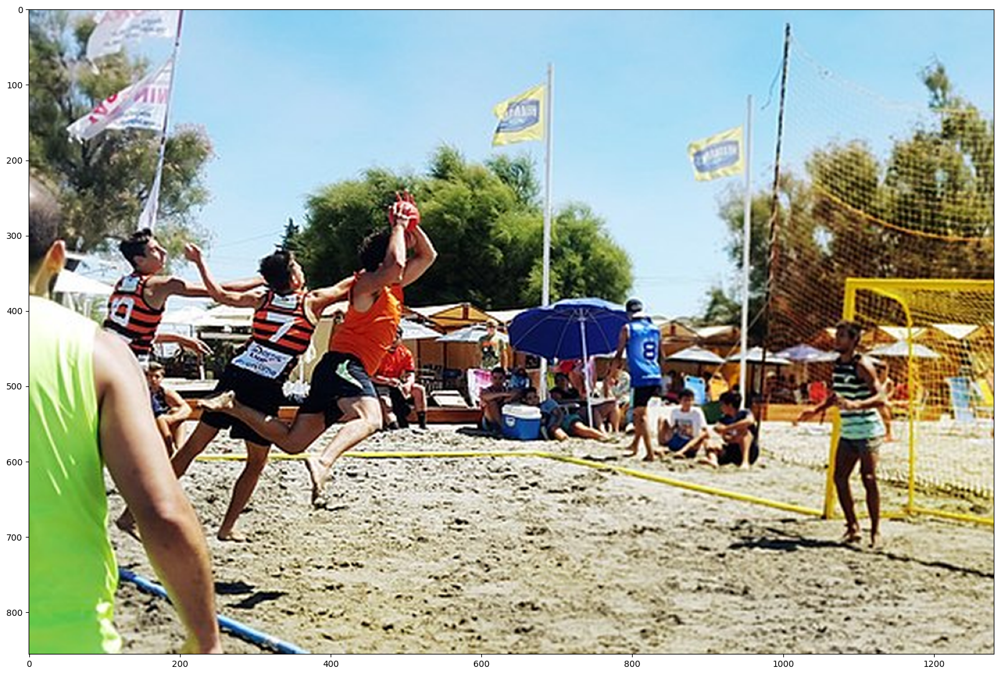

In [19]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러옵니다.

In [9]:
import tensorflow_hub as hub
import os

# 캐시 디렉토리 설정
cache_dir = './tf_hub_cache'
os.makedirs(cache_dir, exist_ok=True)
os.environ['TFHUB_CACHE_DIR'] = cache_dir

print("모델 다운로드 시작...")
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']
print("모델 다운로드 및 로드 완료!")

모델 다운로드 시작...
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


모델 다운로드 및 로드 완료!


In [8]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [10]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.






In [16]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

detector를 실행

Found 100 objects.
Inference time:  6.129631280899048
Font not found, using default font.


C:\Users\User\AppData\Local\Temp\ipykernel_17776\3949730329.py:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
C:\Users\User\AppData\Local\Temp\ipykernel_17776\3949730329.py:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


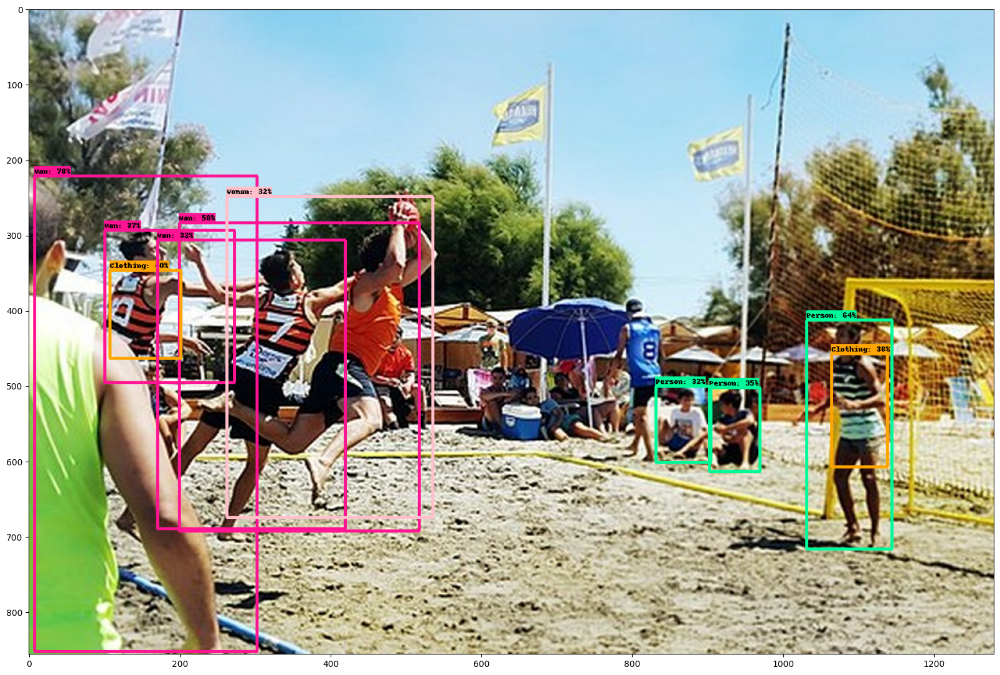

In [20]:
run_detector(detector, downloaded_image_path)

## 문제 2-1. 다른 이미지 테스트해보기


Image downloaded to C:\Users\User\AppData\Local\Temp\tmpj50qw1xv.jpg.


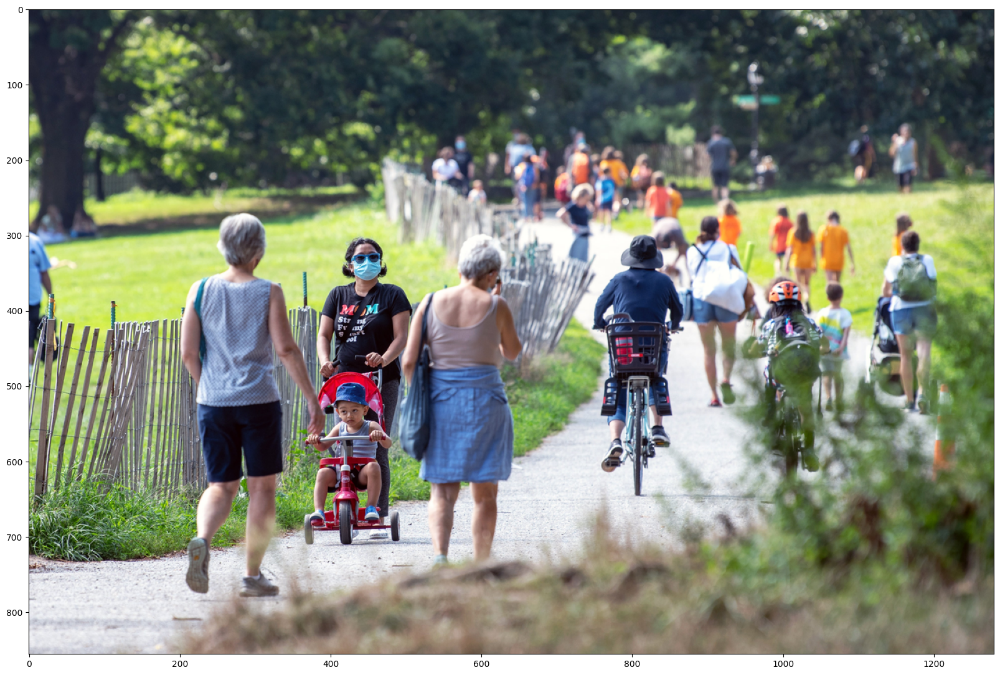

In [50]:
# 이미지 불러오기
image_url = "https://media.newyorker.com/photos/5fa9c90fa1c3773a925b41a9/16:9/w_4623,h_2600,c_limit/Nissan-were-in-the-park.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)


Found 100 objects.
Inference time:  6.334368467330933
Font not found, using default font.


C:\Users\User\AppData\Local\Temp\ipykernel_17776\3949730329.py:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
C:\Users\User\AppData\Local\Temp\ipykernel_17776\3949730329.py:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


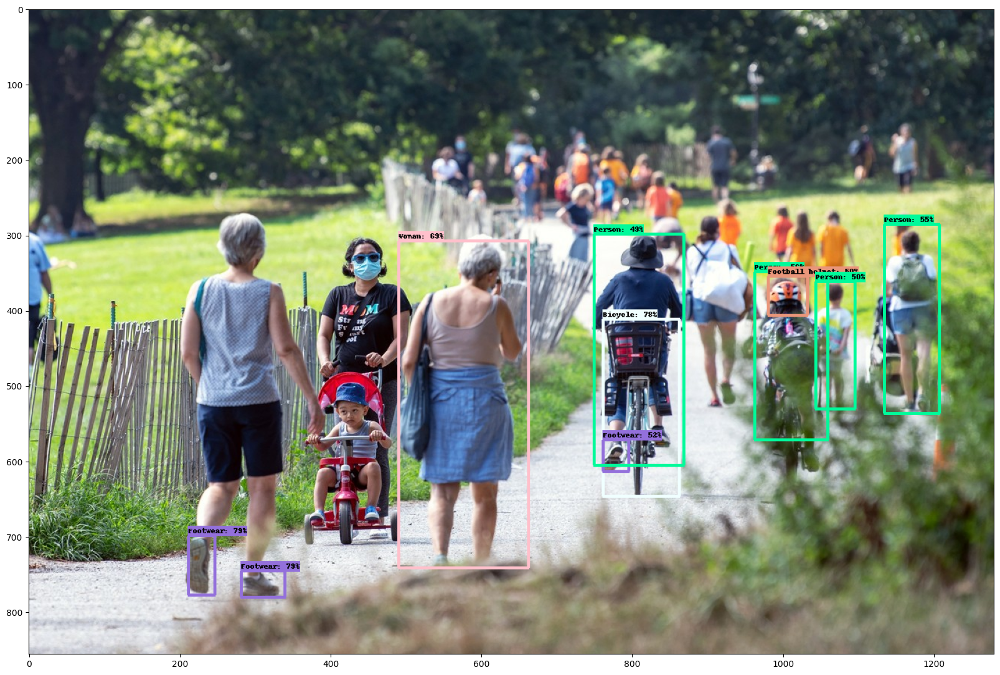

In [18]:
# 테스트
run_detector(detector, downloaded_image_path)

# 문제 2-2. 다양한 pre-trained model 테스트해보기


In [58]:
# 필요한 모듈 임포트
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
from PIL import Image, ImageColor, ImageDraw, ImageFont, ImageOps
import time
import os
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [59]:
# 문제 2-2. 모델 불러오기 (SSD MobileNet)
module_handle = "https://tfhub.dev/tensorflow/efficientdet/d0/1"
detector = hub.load(module_handle).signatures['serving_default']

In [68]:
# EfficientDet-Lite0 모델

coco_labels = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog',
    'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe',
    'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
    'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
    'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot',
    'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
    'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop',
    'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
    'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock',
    'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
# 이미지 시각화 함수
def display_image(image):
    fig = plt.figure(figsize=(20, 15))
    plt.grid(False)
    plt.imshow(image)

# 이미지 다운로드 및 리사이징 함수
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)  # 이미지 읽기
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS) # 이미지 조정
    pil_image_rgb = pil_image.convert("RGB") # RGB로 변환
    pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
    print("Image downloaded to %s." % filename)
    if display:
        display_image(pil_image)
    return filename

# Bounding Box 함수
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                  ymin * im_height, ymax * im_height)

    # BBox 테두리 그리기
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
               (left, top)],
              width=thickness,
              fill=color)

    # getsize를 getbbox로 변경 (최신 Pillow 버전에 맞춤)
    display_str_heights = [font.getbbox(ds)[3] - font.getbbox(ds)[1] for ds in display_str_list]
    
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
    
    for display_str in display_str_list[::-1]:
        bbox = font.getbbox(display_str)
        text_width = bbox[2] - bbox[0]
        text_height = bbox[3] - bbox[1]
        margin = np.ceil(0.05 * text_height)
        
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                       (left + text_width, text_bottom)],
                      fill=color)
        
        draw.text((left + margin, text_bottom - text_height - margin),
                 display_str,
                 fill="black",
                 font=font)
        text_bottom -= (text_height + margin)

    return image

# Box 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
    colors = list(ImageColor.colormap.values())

    # BBox 그리기 적용
    for i in range(min(len(boxes), max_boxes)):
        score = float(scores[i])  # float로 변환
        if score >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
            display_str = "{}: {}%".format(class_names[i],
                                         int(100 * score))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
                image_pil,
                ymin,
                xmin,
                ymax,
                xmax,
                color,
                font,
                display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img  


In [70]:
def run_detector(detector, path):
    img = load_img(path) 

    converted_img = tf.expand_dims(img, 0)

    # 소요시간 측정
    start_time = time.time()
    result = detector(converted_img)  
    end_time = time.time()

    # # 모델 출력 키 확인
    # print("Model output keys:", result.keys())

    # try:
    # 모델 출력 결과를 numpy 형식으로 변환
    result = {key: value.numpy() for key, value in result.items()}

    # 배치 차원 제거 및 리스트로 변환
    boxes = result['detection_boxes'][0].tolist()              
    classes = result['detection_classes'][0].astype(int).tolist() 
    scores = result['detection_scores'][0].tolist()            

    print("Found %d objects." % len(scores))
    print("Inference time: ", end_time - start_time)

    # 클래스 ID를 클래스 이름으로 매핑
    class_names = []
    for class_id in classes:
        if 1 <= class_id <= len(coco_labels):
                class_names.append(coco_labels[class_id - 1])  # 클래스 ID는 1부터 시작
        else:
            class_names.append('N/A')

    # 이미지에 박스 그리기
    image_with_boxes = draw_boxes(
        img.numpy(), boxes, class_names, scores, max_boxes=10, min_score=0.5)

    display_image(image_with_boxes)

    # except KeyError as e:
    #     print(f"KeyError: {e}. 모델의 출력 키를 확인해주세요.")

Image downloaded to C:\Users\User\AppData\Local\Temp\tmpp282zvo_.jpg.


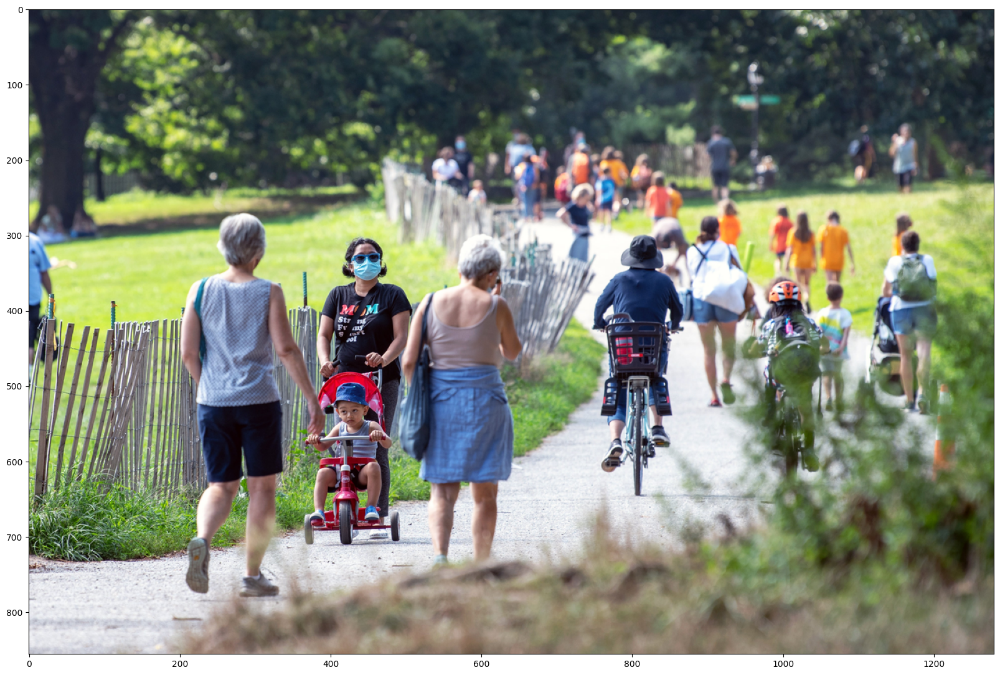

In [28]:
# 이미지 불러오기
image_url = "https://media.newyorker.com/photos/5fa9c90fa1c3773a925b41a9/16:9/w_4623,h_2600,c_limit/Nissan-were-in-the-park.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [71]:
# 문제 2-2. 테스트 
run_detector(detector, downloaded_image_path)

Found 100 objects.
Inference time:  0.8546640872955322


NameError: name 'font' is not defined